# install (Colab)

In [1]:
# try: 
#     import fastcore as FC
# except ImportError: 
#     !pip install -q fastcore
# try:
#     import rich
# except ImportError:
#     !pip install -q rich


In [2]:
# !pip install -q git+https://github.com/civvic/PanelCleaner.git@basic-tesseract

# -

In [3]:
import base64
import copy
import dataclasses
import difflib
import html
import json
import re
import time
import uuid
from importlib import resources
from io import BytesIO
from pathlib import Path

import pcleaner.cli_utils as cli
import pcleaner.config as cfg
import pcleaner.ctd_interface as ctm
import pcleaner.data
import pcleaner.image_ops as ops
import pcleaner.ocr.ocr as ocr
import pcleaner.preprocessor as pp
import pcleaner.structures as st
import rich
import torch
from IPython.display import display
from IPython.display import display_html
from IPython.display import display_javascript
from IPython.display import HTML
from PIL import Image
from PIL import ImageDraw
from PIL import ImageFilter
from PIL import ImageFont
from rich.console import Console


# Helpers

In [4]:
%load_ext rich

In [5]:
console = Console(width=104, tab_size=4, force_jupyter=True)
cprint = console.print

Collapsable JSON in a notebook cell

In [6]:
class RenderJSON(object):
    """
    A class for rendering JSON data in Jupyter notebooks using the `renderjson` JavaScript library.

    This class allows for the interactive display of JSON data within a Jupyter notebook cell. It utilizes
    the `renderjson` library to render the JSON in a collapsible format, making it easier to navigate complex
    JSON structures.

    Attributes:
        json_str (str): A string representation of the JSON data to be rendered. If the input `json_data` is a
                        dictionary, it is converted to a JSON string. Otherwise, it is assumed to be a JSON string.
        uuid (str): A unique identifier for the HTML container element that will display the JSON data. This is
                    used to ensure that the JavaScript code manipulates the correct HTML element in the notebook.

    Args:
        json_data (dict or str): The JSON data to be rendered. Can be a dictionary or a JSON-formatted string.

    Example:
        >>> json_data = {"name": "John", "age": 30, "city": "New York"}
        >>> RenderJSON(json_data)

    Note:
        This class requires the Jupyter notebook environment to function properly, as it relies on IPython's
        display functions and the execution of JavaScript within the notebook.
    """

    def __init__(self, json_data, height=600, init_level=0):
        "Initializes the RenderJSON object with the provided JSON data."
        if isinstance(json_data, dict):
            self.json_str = json.dumps(json_data)
        else:
            self.json_str = json_data
        self.uuid = str(uuid.uuid4())
        self.height = height
        self.init_level = init_level

    def _ipython_display_(self):
        """
        Special method used by IPython to display the JSON data when the object is returned in a notebook cell.

        This method creates an HTML container with a unique ID for the JSON data and uses the `renderjson`
        JavaScript library to render the data within that container. The JSON data is displayed in a collapsible
        format, allowing for interactive exploration of the JSON structure.
        """
        display_html(
            '<div id="{}" style="height: {}px; width:100%;"></div>'.format(self.uuid, self.height), raw=True
        )
        display_javascript(
            """
        require(["https://rawgit.com/caldwell/renderjson/master/renderjson.js"], function() {
        renderjson.set_show_to_level(%s);
        document.getElementById('%s').appendChild(renderjson(%s))
        });
        """
            % (self.init_level, self.uuid, self.json_str),
            raw=True,
        )

Show images and texts on a HTML table

In [7]:
def get_image_html(image: Image.Image, max_width: int | None = None):
    """
    Converts a PIL image to an HTML image tag containing the image as a base64 blob.

    :param image: A PIL Image object.
    :param max_size: A PIL Image object.
    :return: A string containing an HTML <img> tag with the image.
    """
    buffered = BytesIO()
    image.save(buffered, format="PNG")
    img_str = base64.b64encode(buffered.getvalue()).decode()
    style = f' style="max-width: {max_width}px;"' if max_width is not None else ""
    return f'<img src="data:image/png;base64,{img_str}"{style}/>'


def get_columns_html(
    columns: list[list], max_image_width: int | None = None, headers: list[str] | None = None
):
    if not all(len(col) == len(columns[0]) for col in columns):
        raise ValueError("All columns must have the same length.")

    html_str = "<table>"

    if headers:
        if len(headers) != len(columns):
            raise ValueError("Headers list must match the number of columns.")
        html_str += (
            "<tr>"
            + "".join(
                f"<th style='text-align: center; font-weight: bold;'>{header}</th>"
                for header in headers
            )
            + "</tr>"
        )

    for row_items in zip(*columns):
        html_str += "<tr>"
        for i, item in enumerate(row_items):
            if isinstance(item, Image.Image):
                img_html = get_image_html(item, max_width=max_image_width)
                html_str += f"<td style='text-align: center;'>{img_html}</td>"
            else:  # Assume the item is a string
                style = "font-weight: bold;" if i == 0 else ""
                html_str += f"<td style='font-size: 12pt; text-align: left; {style}'>{item}</td>"
        html_str += "</tr>"

    html_str += "</table>"
    return html_str


def display_columns(
    columns: list[list], max_image_width: int | None = None, headers: list[str] | None = None
):
    """
    Displays a table with any combination of columns, which can be lists of strings or lists of PIL Image objects,
    within a Jupyter notebook cell.

    :param columns: A list of lists, where each sublist represents a column in the table. Each sublist can contain
                    either strings or PIL Image objects.
    :param max_image_width: The maximum size of the images in pixels. This controls the max-height of the images.
    :param headers: A list of header labels for the table. If None, no headers are displayed.
    """
    return display(HTML(get_columns_html(columns, max_image_width, headers)))


def get_image_grid_html(
    images: list[Image.Image],
    rows: int,
    columns: int,
    titles: list[str] | None = None,
    max_image_width: int | None = None,
):
    if titles and len(titles) != len(images):
        raise ValueError("Titles list must match the number of images if provided.")

    html_str = "<table>"

    image_index = 0
    for row in range(rows):
        html_str += "<tr>"
        for col in range(columns):
            if image_index < len(images):
                img_html = get_image_html(images[image_index], max_width=max_image_width)
                title_html = (
                    f"<div style='text-align: center;'>{titles[image_index]}</div>"
                    if titles
                    else ""
                )
                html_str += f"<td style='text-align: center;'>{title_html}{img_html}</td>"
            else:
                html_str += "<td></td>"  # Empty cell if no more images
            image_index += 1
        html_str += "</tr>"

    html_str += "</table>"
    return html_str


def display_image_grid(
    images: list[Image.Image],
    rows: int,
    columns: int,
    titles: list[str] | None = None,
    max_image_width: int | None = None,
):
    """
    Displays a grid of images in a HTML table within a Jupyter notebook cell.

    :param images: A list of PIL Image objects to be displayed.
    :param rows: The number of rows in the grid.
    :param columns: The number of columns in the grid.
    :param titles: An optional list of titles for each image. If provided, it must match the length of the images list.
    :param max_image_width: The maximum width of the images in pixels. This controls the max-width of the images.
    """
    return display(HTML(get_image_grid_html(images, rows, columns, titles, max_image_width)))

Visualize boxes on the page image, adapted from `PageData.visualize` but returns the image instead of saving it.

In [8]:
def page_boxes(self: st.PageData) -> Image.Image:
    """
    Visualize the boxes on an image.
    Typically, this would be used to check where on the original image the
    boxes are located.

    :param image_path: The path to the image to visualize the boxes on.
    """
    image = Image.open(self.image_path)
    draw = ImageDraw.Draw(image)
    data_path = resources.files(pcleaner.data)
    font_path = str(data_path / "LiberationSans-Regular.ttf")
    # Figure out the optimal font size based on the image size. E.g. 30 for a 1600px image.
    font_size = int(image.size[0] / 50) + 5

    for index, box in enumerate(self.boxes):
        draw.rectangle(box.as_tuple, outline="green")
        # Draw the box number, with a white background, respecting font size.
        draw.text(
            (box.x1 + 4, box.y1),
            str(index + 1),
            fill="green",
            font=ImageFont.truetype(font_path, font_size),
            stroke_fill="white",
            stroke_width=3,
        )

    for box in self.extended_boxes:
        draw.rectangle(box.as_tuple, outline="red")
    for box in self.merged_extended_boxes:
        draw.rectangle(box.as_tuple, outline="purple")
    for box in self.reference_boxes:
        draw.rectangle(box.as_tuple, outline="blue")

    return image

Simple crop

In [9]:
def crop_box(box: st.Box, image: Image.Image) -> Image.Image:
    return image.crop(box.as_tuple)

----
# Optimizing Tesseract for Comics
> Accuracy Enhancements in PanelCleaner



## Configuration

In [10]:
config = cfg.load_config()
config.cache_dir = Path(".")
config.show()
profile = config.current_profile
ocr_processor = ocr.get_ocr_processor(True, cfg.OCREngine.TESSERACT)
cache_dir = config.get_cleaner_cache_dir()
cache_masks = True

cache_dir, cache_masks, ocr_processor

2024-04-21 19:15:00.313 | INFO     | pcleaner.ocr.ocr_mangaocr:__new__:15 - Creating the MangaOcr instance


Current Configuration:

Locale: System default
Default Profile: Built-in
Saved Profiles:
- victess: /Users/vic/dev/repo/DL-mac/cleaned/victess.conf
- vicmang: /Users/vic/dev/repo/DL-mac/cleaned/vicmang.conf

Profile Editor: cursor
Cache Directory: .
Default Torch Model Path: /Users/vic/Library/Caches/pcleaner/model/comictextdetector.pt
Default CV2 Model Path: /Users/vic/Library/Caches/pcleaner/model/comictextdetector.pt.onnx
GUI Theme: System default

--------------------

Config file located at: /Users/vic/Library/Application Support/pcleaner/pcleanerconfig.ini
System default cache directory: /Users/vic/Library/Caches/pcleaner



(
    PosixPath('cleaner'),
    True,
    {
        <DetectedLang.JA: 'ja'>: <pcleaner.ocr.ocr_tesseract.TesseractOcr object at 0x2a26b6d90>,
        <DetectedLang.ENG: 'eng'>: <pcleaner.ocr.ocr_tesseract.TesseractOcr object at 0x115345290>,
        <DetectedLang.UNKNOWN: 'unknown'>: <pcleaner.ocr.ocr_tesseract.TesseractOcr object at 0x2a4ebfd90>
    }
)

In [11]:
preprocessor_conf = profile.preprocessor
# Modify the profile to OCR all boxes.
# Make sure OCR is enabled.
preprocessor_conf.ocr_enabled = True
# Make sure the max size is infinite, so no boxes are skipped in the OCR process.
preprocessor_conf.ocr_max_size = 10**10
# Make sure the sus box min size is infinite, so all boxes with "unknown" language are skipped.
preprocessor_conf.suspicious_box_min_size = 10**10
# Set the OCR blacklist pattern to match everything, so all text gets reported in the analytics.
preprocessor_conf.ocr_blacklist_pattern = ".*"

In [12]:
gpu = torch.cuda.is_available() or torch.backends.mps.is_available()
model_path = config.get_model_path(gpu)
device = ("mps" if torch.backends.mps.is_available() else "cuda") if model_path.suffix == ".pt" else "cpu"
model_path, device

(PosixPath('/Users/vic/Library/Caches/pcleaner/model/comictextdetector.pt'), 'mps')

In [13]:
if len(list(cache_dir.glob("*"))) > 0:
    cli.empty_cache_dir(cache_dir)

### base_image (change to test with other images)

In [14]:
media_path = Path("media/")
image_paths = [
    media_path / 'Strange Tales 172.png',
]
assert image_paths[0].exists()
base_image = Image.open(image_paths[0])

Balloons and captions ground truth

In [15]:
gts = """Embowered by great gnarled cypress trees, the ancient manor stands alone on the outskirts of New Orleans, kept tidy by a white-haired old man known only as Bambu.
The house and the oldman are alike in many ways, tall, proud, patient, contented always to wait until their master comes home--
And one in need of some help, it would appear.
Bambu-- we have a guest.
--and tonight, he comes most urgently, slamming open the oaken front doors!
Tell me master-- how may Bambu serve?
Some blankets to keep her warm, Bambu-- and perhaps some dry clothes
The echo of the old man's footsteps fades down the hall as...
How curious the whims of fate. Had I not chanced to stroll along the river tonight--
As quickly as I can, master
--the girl would most surely be dead by now.
Ghedde has been generous. the Death God has given the girl a second chance at--
Easy girl-- there's nothing to scream about anymore.
You're among friends now, you're safe!
Continued after next page
""".splitlines()

## Text mask

Using device for text detection model: mps
Using 1 processes for text detection.


100%|██████████| 1/1 [00:00<00:00,  1.22it/s]


,

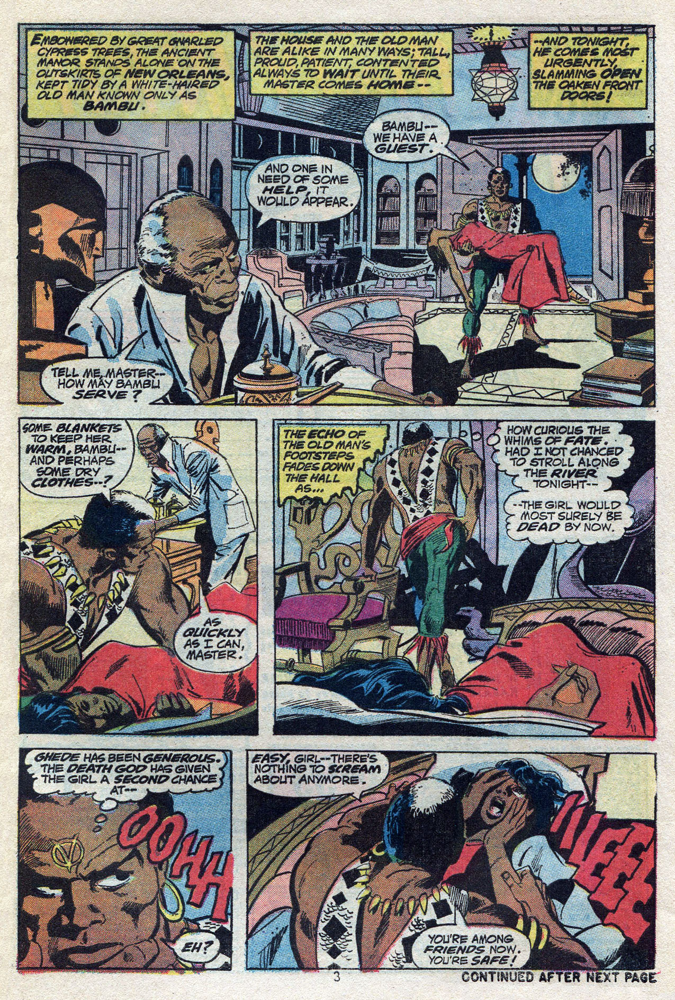
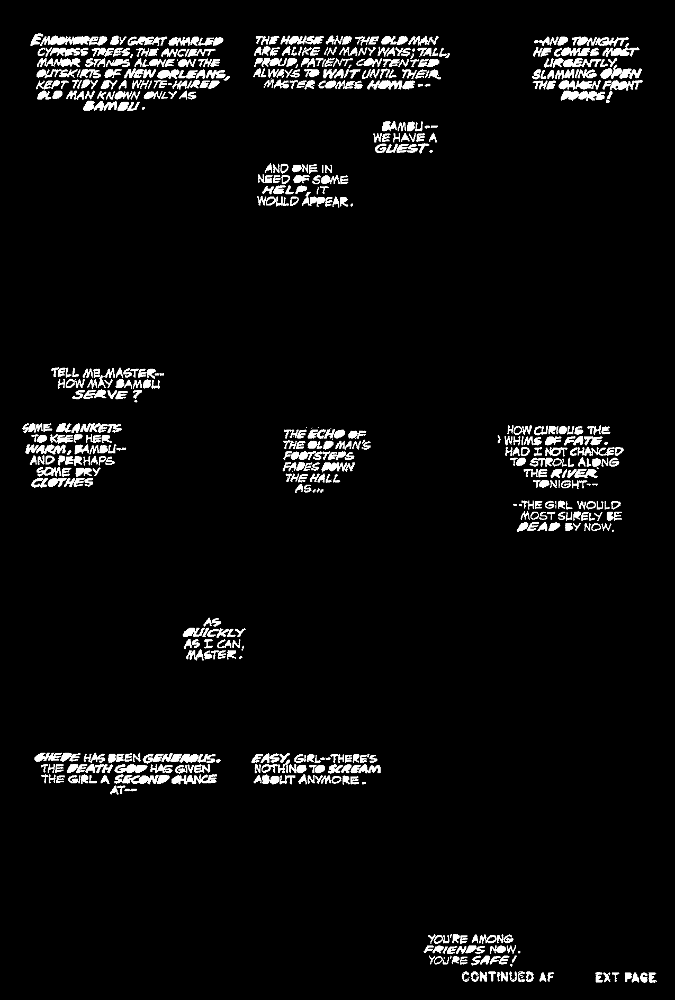

In [16]:
ctm.model2annotations(profile.general, profile.text_detector, model_path, image_paths, cache_dir)
jsons = list(cache_dir.glob("*.json"))
json_file_path = jsons[0]
json_data = json.loads(json_file_path.read_text(encoding="utf-8"))
image_path: str = json_data["image_path"]
mask_path: str = json_data["mask_path"]
original_path: str = json_data["original_path"]
scale: float = json_data["scale"]
mask = Image.open(mask_path)

display_image_grid([base_image, mask], 1, 2)

In [17]:
RenderJSON(json_data, 500, 2)

In [18]:
boxes = [st.Box(*data["xyxy"]) for data in json_data["blk_list"]]
cprint(boxes)

[
    Box(x1=58, y1=64, x2=428, y2=208),
    Box(x1=477, y1=62, x2=850, y2=171),
    Box(x1=481, y1=303, x2=666, y2=392),
    Box(x1=701, y1=224, x2=831, y2=289),
    Box(x1=1004, y1=67, x2=1214, y2=190),
    Box(x1=95, y1=688, x2=304, y2=756),
    Box(x1=42, y1=793, x2=235, y2=919),
    Box(x1=533, y1=803, x2=702, y2=932),
    Box(x1=949, y1=800, x2=1181, y2=921),
    Box(x1=342, y1=1164, x2=461, y2=1248),
    Box(x1=967, y1=939, x2=1175, y2=1006),
    Box(x1=69, y1=1419, x2=412, y2=1502),
    Box(x1=472, y1=1420, x2=724, y2=1484),
    Box(x1=799, y1=1758, x2=982, y2=1822),
    Box(x1=858, y1=1827, x2=1238, y2=1860)
]

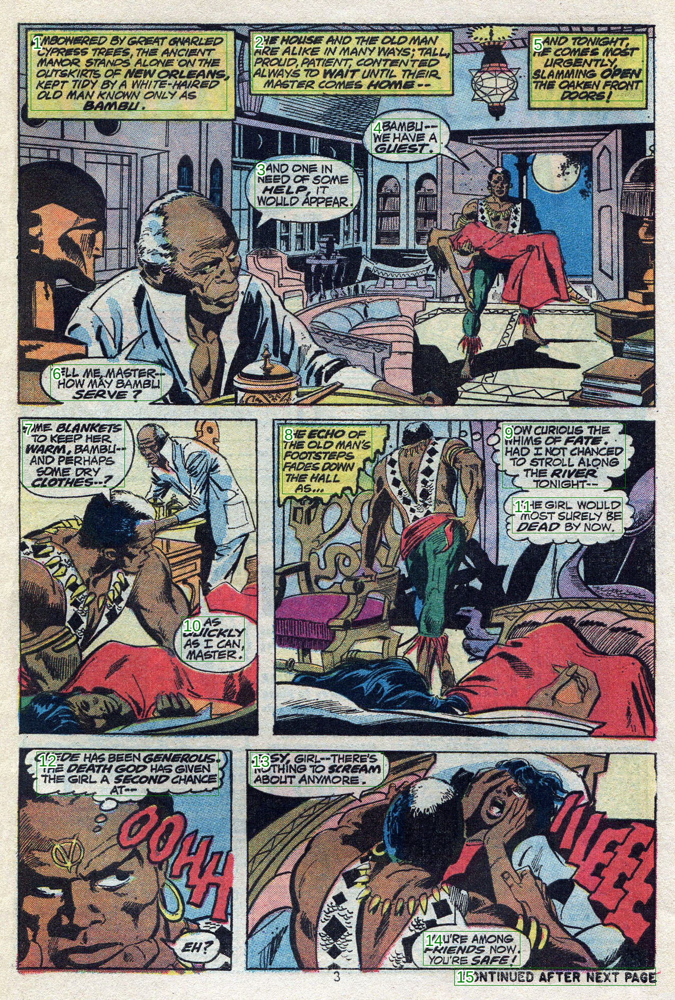

In [19]:
page_lang = st.DetectedLang.ENG
mocr = ocr_processor[page_lang]

page_data = st.PageData(image_path, mask_path, original_path, scale, boxes, [], [], [])

# Merge boxes that have mutually overlapping centers.
page_data.resolve_total_overlaps()

page_boxes(page_data)

In [20]:
def get_text_diffs_html(str1, str2):
    matcher = difflib.SequenceMatcher(None, str1, str2)
    html_str1 = ""
    html_str2 = ""
    ch ='⎕'  # ▿
    ch = f'&#x{ord(ch):x};'
    span1_g = lambda l: f"<span style='color: green;'>{ch*l}</span>" if l > 0 else ""
    span1_r = lambda l: f"<span style='color: red;'>{ch*l}</span>" if l > 0 else ""
    span2 = lambda s: f"<span style='color: red;'>{html.escape(s)}</span>" if s else ""

    for opcode in matcher.get_opcodes():
        tag, i1, i2, j1, j2 = opcode
        if tag == "equal":
            html_str1 += html.escape(str1[i1:i2])
            html_str2 += html.escape(str2[j1:j2])
        elif tag == "replace":
            max_len = max(i2 - i1, j2 - j1)
            # str1_segment = str1[i1:i2].ljust(max_len)
            html_str1 += html.escape(str1[i1:i2]) + span1_g(max_len - (i2 - i1))
            html_str2 += span2(str2[j1:j2]) + span1_r(max_len - (j2 - j1))
        elif tag == "delete":
            deleted_segment = str1[i1:i2]
            html_str1 += html.escape(deleted_segment)
            html_str2 += span1_r(len(deleted_segment))
        elif tag == "insert":
            inserted_segment = str2[j1:j2]
            html_str1 += span1_g(len(inserted_segment))
            html_str2 += span2(inserted_segment)

    return html_str1, html_str2


def display_text_diffs(str1, str2):
    """
    Displays two strings one above the other, with differing characters highlighted in red in the second string only,
    using difflib.SequenceMatcher to align the strings and ensure matching sequences are vertically aligned.

    :param str1: The first string to compare.
    :param str2: The second string to compare.
    """
    html_str1, html_str2 = get_text_diffs_html(str1, str2)
    display(HTML(f"<pre style='font-size: 14px;'>{html_str1}<br/>{html_str2}</pre>"))

In [21]:
str1 = "This is an awesome🂨 test string."
str2 = "This was an amazing test▿ spring."
display_text_diffs(str1, str2)

<IPython.core.display.HTML object>

In [22]:
def remove_multiple_whitespaces(text):
    return ' '.join(text.split())

    
def postprocess_ocr(text):
    return ' '.join(remove_multiple_whitespaces(text).splitlines()).capitalize()

def accuracy_ocr_naive(text, ground_truth):
    return sum(1 for a, b in zip(text, ground_truth) if a == b) / len(text)


def accuracy_ocr_difflib(text, ground_truth):
    """
    Calculates the OCR accuracy based on the similarity between the OCR text and the ground truth text,
    using difflib's SequenceMatcher to account for differences in a manner similar to git diffs.

    :param text: The OCR-generated text.
    :param ground_truth: The ground truth text.
    :return: A float representing the similarity ratio between the OCR text and the ground truth, where 1.0 is identical.
    """
    # Initialize the SequenceMatcher with the OCR text and the ground truth
    matcher = difflib.SequenceMatcher(None, text, ground_truth)
    
    # Get the similarity ratio
    similarity_ratio = matcher.ratio()
    
    return similarity_ratio

In [23]:
@dataclasses.dataclass
class Result:
    block_idx: int
    image: Image.Image
    ocr: str
    gt: str
    description: str = dataclasses.field(default='', kw_only=True)

    def __post_init__(self): self._acc = accuracy_ocr_difflib(self.ocr, self.gt)

    @property
    def acc(self): return self._acc

    def as_html(self):
        acc_html = f"<br/><strong><span style='color: red;'>{self.acc:.2f}</span></strong>"
        html1 = get_columns_html([[self.image], [self.ocr + acc_html]])
        html_str1, html_str2 = get_text_diffs_html(self.gt, self.ocr)
        html2 = f"<pre style='font-size: 14px;'>{html_str1}<br/>{html_str2}</pre>"
        return html1 + '\n<br/>\n' + html2

    def display(self): display(HTML(self.as_html()))
    
    def _ipython_display_(self): self.display()

#### box_idx (change to test with other box)

In [24]:
results: dict[str, Result] = {}
box_idx = 0

## comics_text_detector initial boxes + padding

### Initial box

,"Emnbonered by great gnarled cypress. lipiei the ancient manor stands alone on the outski © of new orc. ans, kept tidy by a white-haired old man known only as bam: :0.89"

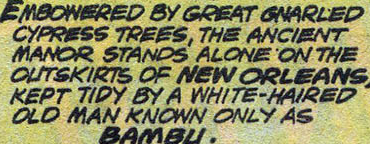

In [25]:
method = "Initial box"

image = crop_box(page_data.boxes[box_idx], base_image)
text = mocr(image)
results[method] = Result(box_idx, image, postprocess_ocr(text), gts[box_idx])
results[method]

### PanelCleaner default pad

,"Embownered by great gnarled cypress. lipiei the ancient — manor alone on the clutskists of new ore e ans, kept tidy by a white-haired ao man known, only as0.86"

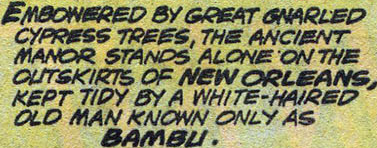

In [26]:
method = "Default"

# Pad the boxes a bit, save a copy, and then pad them some more.
# The copy is used as a smaller mask, and the padded copy is used as a larger mask.
padded2_4 = (page_data.boxes[box_idx].pad(preprocessor_conf.box_padding_initial, base_image.size).
                right_pad(preprocessor_conf.box_right_padding_initial, base_image.size))

image = crop_box(padded2_4, base_image)
text = mocr(image)
results[method] = Result(box_idx, image, postprocess_ocr(text), gts[box_idx])
results[method]

### PanelCleaner default pad, grey pad

,"Embownered by great gnarled cypress trees, the ancient. manor stands. alone ‘on the outskirts of orleans, kept tidy by a white-haired ao flay sp gdias only as0.87"

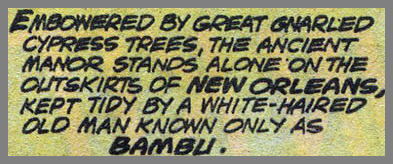

In [27]:
method = "Default, grey pad"

image = ops.pad_image(results["Default"].image, 8, fill_color=(128, 128, 128))
text = mocr(image)
results[method] = Result(box_idx, image, postprocess_ocr(text), gts[box_idx])
results[method]

### padded, 4px

,"Embowered by great gnarled cypress. lipiei the ancient — manor stands alone on the clutskists of new ore e ans, kept tidy by a white-haired ao lo man known, only as0.88"

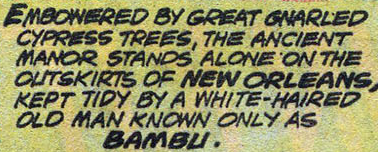

In [28]:
method = "Padded 4px"

padded4 = page_data.boxes[box_idx].pad(4, base_image.size)

image = crop_box(padded4, base_image)
text = mocr(image)
results[method] = Result(box_idx, image, postprocess_ocr(text), gts[box_idx])
results[method]

### padded, 8px

,"Embownered by great gnarled cypress trees, the ancient manor stands alone on the oos of wew orleans, kept tidy by a white-haired ao lo man known only as0.92"

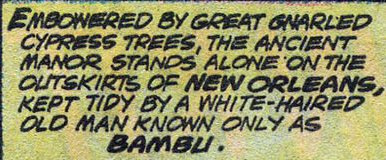

In [29]:
method = "Padded 8px"

padded8 = page_data.boxes[box_idx].pad(8, base_image.size)

image = crop_box(padded8, base_image)
text = mocr(image)
results[method] = Result(box_idx, image, postprocess_ocr(text), gts[box_idx])
results[method]

## Extracted text

### Extracted text, initial box

In [30]:
def extract_text(image, text_mask, box):
    cropped_image = crop_box(box, image)
    cropped_mask = crop_box(box, text_mask)
    extracted = ops.extract_text(cropped_image, cropped_mask)
    return cropped_image, cropped_mask, extracted

def acc_as_html(acc):
    return f"<div style='font-size: 12pt;'><strong style='color: red;'>{acc:.2f}</strong><div/>"

def display_extracted_result(cropped_image, cropped_mask, extracted, result):
    html_str1, html_str2 = get_text_diffs_html(gts[result.block_idx], result.ocr)
    diff_html = f"<pre style='font-size: 14px;'>{html_str1}<br/>{html_str2}</pre>"
    display(HTML('\n<br/>\n'.join([
        get_image_grid_html([cropped_image, cropped_mask, extracted], 1, 3), 
        acc_as_html(result.acc), 
        diff_html
    ])))

,,

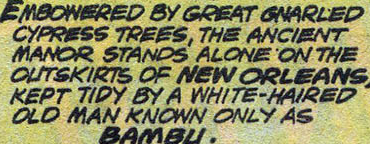
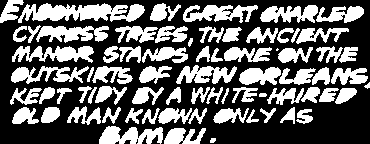
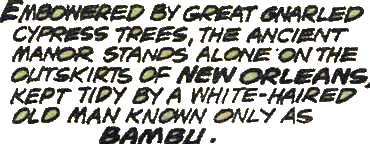

In [31]:
method = "Extracted, init box"

cropped_image, cropped_mask, extracted = extract_text(base_image, mask, page_data.boxes[box_idx])
text = mocr(extracted)
results[method] = Result(box_idx, extracted, postprocess_ocr(text), gts[box_idx])

# display(HTML(f"<div style='font-size: 12pt;'>{text}<br/><strong style='color: red;'>{accuracy_ocr_difflib(text, gts[box_idx]):.2f}</strong><div/>"))
display_extracted_result(cropped_image, cropped_mask, extracted, results[method])

### padded 4, extracted

,,

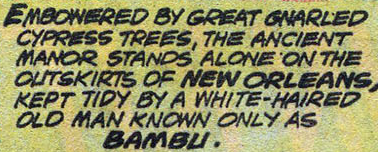
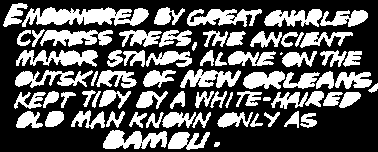
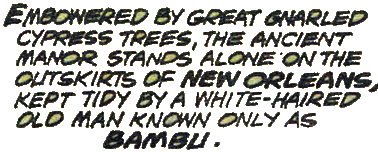

In [32]:
method = "Padded 4, extracted"

padded4 = page_data.boxes[box_idx].pad(4, base_image.size)
cropped_image, cropped_mask, extracted = extract_text(base_image, mask, padded4)
text = mocr(extracted)
results[method] = Result(box_idx, extracted, postprocess_ocr(text), gts[box_idx])

display_extracted_result(cropped_image, cropped_mask, extracted, results[method])

### padded 8, dilation 1, extracted

In [33]:
# dilate by 1 pixel
mask_dilated1 = mask.filter(ImageFilter.MaxFilter(3))
# mask_dilated1


,,

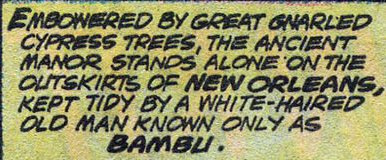
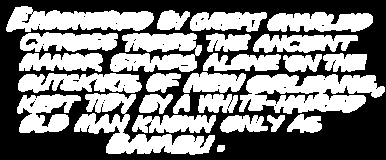
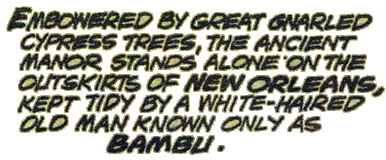

In [34]:
method = "Padded 8, dilation 1"

padded8 = page_data.boxes[box_idx].pad(8, base_image.size)
cropped_image, cropped_mask, extracted = extract_text(base_image, mask_dilated1, padded8)
text = mocr(extracted)
results[method] = Result(box_idx, extracted, postprocess_ocr(text), gts[box_idx])

display_extracted_result(cropped_image, cropped_mask, extracted, results[method])

### padded 4, dilation 0.5, extracted

In [35]:
def dilate_by_fractional_pixel(image, dilation_fraction, filter_base_size=3):
    """
    Dilates a 1-bit image by a specified fractional pixel amount using resize and filter operations,
    with bicubic interpolation for smoother results. The function calculates the necessary scaling
    factor and filter size based on the desired dilation fraction.

    :param image: A PIL Image object (1-bit mode).
    :param dilation_fraction: The desired fractional pixel amount for dilation (e.g., 0.2).
    :param filter_base_size: The base size of the dilation filter to apply on the scaled image.
                             This size is adjusted based on the scaling factor to achieve the
                             desired dilation effect.
    :return: A PIL Image object after dilation, converted back to grayscale.
    """
    # Calculate the scale factor based on the desired dilation fraction
    scale_factor = int(1 / dilation_fraction)
    
    # Adjust the filter size based on the scale factor
    # This ensures the dilation effect is proportional to the desired fraction
    filter_size = max(1, filter_base_size * scale_factor // 5)

    # Convert the image to grayscale for more nuanced intermediate values
    image_gray = image.convert("L")

    # Resize the image to a larger size using bicubic interpolation
    larger_size = (int(image.width * scale_factor), int(image.height * scale_factor))
    image_resized = image_gray.resize(larger_size, Image.BICUBIC)

    # Apply the dilation filter to the resized image
    dilated_image = image_resized.filter(ImageFilter.MaxFilter(filter_size))

    # Resize the image back to its original size using bicubic interpolation
    image_dilated_fractional_pixel = dilated_image.resize(image.size, Image.BICUBIC)

    return image_dilated_fractional_pixel


In [36]:
# dilate by 0.5 pixel
mask_dilated_05 = dilate_by_fractional_pixel(mask, 0.5)
# mask_dilated_05


,,

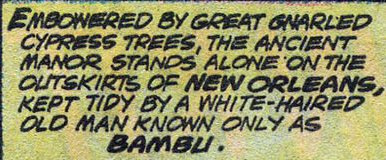
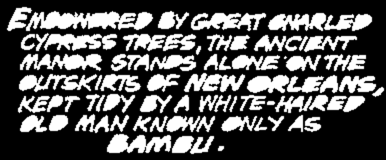
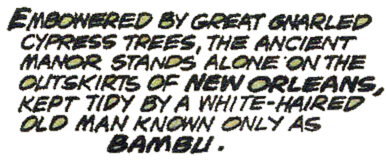

In [37]:
method = "Pad 8, fract. 0.5"

cropped_image, cropped_mask, extracted = extract_text(base_image, mask_dilated_05, padded8)
text = mocr(extracted)
results[method] = Result(box_idx, extracted, postprocess_ocr(text), gts[box_idx])

display_extracted_result(cropped_image, cropped_mask, extracted, results[method])

### padded 4, dilation 0.2, extracted

In [38]:
# dilate by 0.2 pixel
mask_dilated_02 = dilate_by_fractional_pixel(mask, 0.2)
# mask_dilated_02


,,

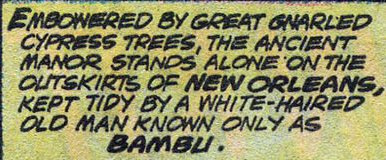
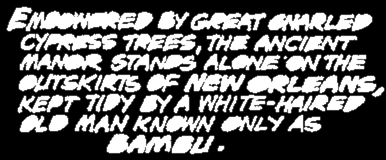
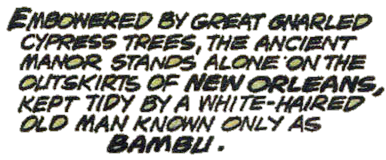

In [39]:
method = "Pad 8, fract. 0.2"

cropped_image, cropped_mask, extracted = extract_text(base_image, mask_dilated_02, padded8)
text = mocr(extracted)
results[method] = Result(box_idx, extracted, postprocess_ocr(text), gts[box_idx])

display_extracted_result(cropped_image, cropped_mask, extracted, results[method])

Method,Box,Accuracy,OCR
Initial box,,0.89,"Emnbonered by great gnarled cypress. lipiei the ancient manor stands alone on the outski © of new orc. ans, kept tidy by a white-haired old man known only as bam: :"
Default,,0.86,"Embownered by great gnarled cypress. lipiei the ancient — manor alone on the clutskists of new ore e ans, kept tidy by a white-haired ao man known, only as"
"Default, grey pad",,0.87,"Embownered by great gnarled cypress trees, the ancient. manor stands. alone ‘on the outskirts of orleans, kept tidy by a white-haired ao flay sp gdias only as"
Padded 4px,,0.88,"Embowered by great gnarled cypress. lipiei the ancient — manor stands alone on the clutskists of new ore e ans, kept tidy by a white-haired ao lo man known, only as"
Padded 8px,,0.92,"Embownered by great gnarled cypress trees, the ancient manor stands alone on the oos of wew orleans, kept tidy by a white-haired ao lo man known only as"
"Extracted, init box",,0.94,"Enbonered by great gnarled cypress trees, the ancient manor stanes alone on the outskirts of new orleans kept tidy by a white-hairel olo man known only as bam."
"Padded 4, extracted",,0.91,"Embowbred by great sharlel cypress trees, the anc manor stanos alone on the itskirts of new orleans, kept tidy by a white-h4ired olo man known only as bambl."
"Padded 8, dilation 1",,0.61,"Outskirts of new orleans, kept tipy by a white-haired olo man known only as bambl ."
"Pad 8, fract. 0.5",,0.94,"Enbowered by great onarled cypress trees, the ancient manor stanes alone on the oltskirts of new orleans, kept tidy by a white-haired olo man known only as bambi."
"Pad 8, fract. 0.2",,0.95,"Embowered by great onarled cypress trees, the ancient manor stances alone on the oltskirts of new orleans, kept tidy by a white-haired olo man known only as bambl."

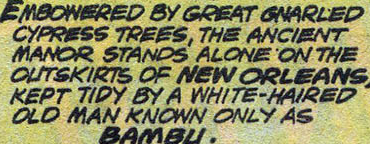
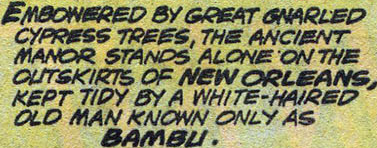
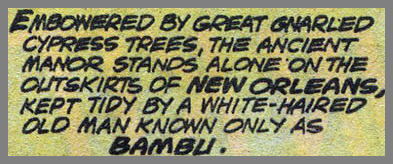
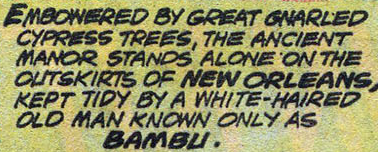
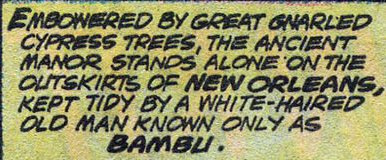
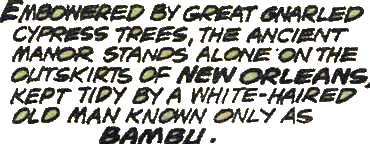
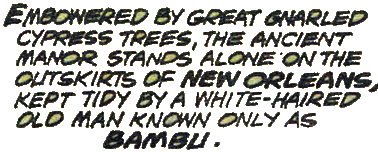
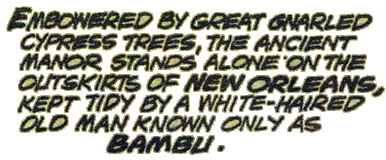
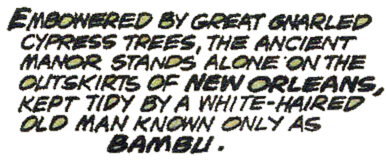
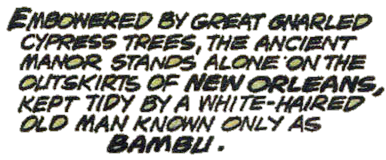

In [40]:
methods, images, ocrs, accs = zip(*map(lambda t: (t[0], t[1].image, t[1].ocr, acc_as_html(t[1].acc)), results.items()))
display_columns([methods, images, accs, ocrs], headers=["Method", "Box", "Accuracy", "OCR"])

## Full page

In [41]:
results_full: dict[int, Result] = {}
page_name = f"{Path(page_data.original_path).stem}"
for i,box in enumerate(page_data.boxes):
    padded8 = box.pad(8, base_image.size)
    cropped_image, cropped_mask, extracted = extract_text(base_image, mask_dilated_02, padded8)
    text = mocr(extracted)
    results_full[i] = Result(i, extracted, postprocess_ocr(text), gts[i], description=f"{page_name}: {i:02}")

Balloon,Image,Accuracy,OCR
Strange Tales 172: 00,,0.95,"Embowered by great onarled cypress trees, the ancient manor stances alone on the oltskirts of new orleans, kept tidy by a white-haired olo man known only as bambl."
Strange Tales 172: 01,,0.98,"The house and the oldman are alike in many ways} tall, proud, patient, contented always to wait until their, master comes home --"
Strange Tales 172: 02,,0.69,Ano one in eae oor would appear.
Strange Tales 172: 03,,0.86,Banbli-~ we have a guest.
Strange Tales 172: 04,,0.63,"And tonight, he comes slamming open urgently,"
Strange Tales 172: 05,,0.85,Tell me master. how may bambli serve t
Strange Tales 172: 06,,0.83,"Some. blankets to keep her, warm, bambli-~ and perhaps som"
Strange Tales 172: 07,,0.73,The the old mans fades donn the hall seve
Strange Tales 172: 08,,0.96,How curious the ) whims of fate. had i not chanced to stroll along the river tonight--
Strange Tales 172: 09,,0.85,"Quickly as t can, master."

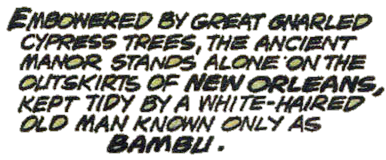
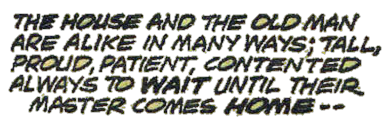
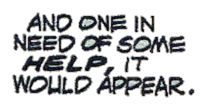
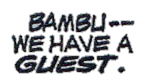
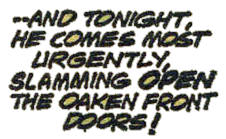
...
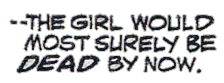
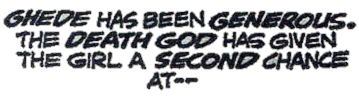
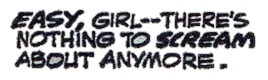
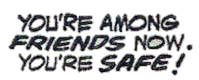
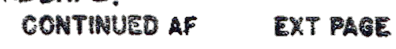

In [42]:
balloons, images, ocrs, accs = zip(*map(
    lambda t: (t[1].description, t[1].image, t[1].ocr, acc_as_html(t[1].acc)), results_full.items()))
display_columns([balloons, images, accs, ocrs], headers=["Balloon", "Image", "Accuracy", "OCR"])